In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import missingno as msno
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from sklearn.metrics import classification_report

import chart_studio.plotly as py
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode(connected=True)
cf.go_offline()


from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
from scipy.stats import f_oneway
import scipy.stats as stats
import math

#to display all the attributes
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# READING FILE 

In this section, We have read our file and replaced ? by nan.

### Problem 1: NA values stored as '?'

- Earlier, we used : df[df=='?'].sum() and df.replace("?",np.nan, inplace=True) to tackle ? marks in our dataset
- As a result , those values were considered as "object" type and were changed to float64 type using the command:
- object_cols=df.select_dtypes(include="object").columns.tolist()
- df[object_cols]=df[object_cols].astype('float')

In [2]:
#Reading file
df=pd.read_csv("1year.arff.csv",na_values ='?')

# df=pd.read_csv("1year.csv",na_values ='?')

# EXPLORING DATA

In [3]:
#shape
df.shape

(7027, 65)

In [4]:
#counts
df['class'].value_counts()

0    6756
1     271
Name: class, dtype: int64

In [5]:
#to remove unbiasedness 
df.sample(10)

,Attr1,Attr2,Attr3,Attr4,Attr5,Attr6,Attr7,Attr8,Attr9,Attr10,Attr11,Attr12,Attr13,Attr14,Attr15,Attr16,Attr17,Attr18,Attr19,Attr20,Attr21,Attr22,Attr23,Attr24,Attr25,Attr26,Attr27,Attr28,Attr29,Attr30,Attr31,Attr32,Attr33,Attr34,Attr35,Attr36,Attr37,Attr38,Attr39,Attr40,Attr41,Attr42,Attr43,Attr44,Attr45,Attr46,Attr47,Attr48,Attr49,Attr50,Attr51,Attr52,Attr53,Attr54,Attr55,Attr56,Attr57,Attr58,Attr59,Attr60,Attr61,Attr62,Attr63,Attr64,class
2091,0.058657,0.79512,-0.026569,0.88728,-13.4620,0.000000,0.081521,0.25768,0.90074,0.20488,0.084378,0.345860,0.115950,0.081521,2778.60,0.131360,1.2577,0.081521,0.090505,1.3102,0.81759,0.074154,0.065120,0.210670,0.15354,0.102600,25.96000,-0.033595,4.2223,0.79893,0.093310,103.760,3.5177,1.042800,0.071600,0.90074,0.36807,0.76430,0.079490,0.321730,0.273020,0.082325,54.016,52.706,18.142000,0.87356,1.4233,0.051230,0.056875,0.26302,0.23570,0.28427,0.25906,0.96640,-443.24,0.079490,0.286290,0.91144,2.730400,278.5800,6.9252,95.512,3.8215,1.1389,0
196,0.173710,0.33871,0.538820,2.91040,150.8200,0.000000,0.214820,1.95240,1.09410,0.66129,0.218670,0.761640,0.267710,0.214820,422.10,0.864730,2.9524,0.214820,0.196350,63.0480,1.59810,0.216670,0.158770,NaN,0.61133,0.743360,56.22200,3.010400,3.8455,0.20652,0.199740,112.990,3.2303,2.689800,0.182990,1.09410,35.70200,0.67899,0.167250,0.402830,0.038305,0.198040,235.950,172.900,0.919180,2.24040,75.7100,0.138600,0.126680,2.42350,0.28204,0.30957,3.69460,3.79350,3775.00,0.167250,0.262680,0.80985,0.026765,5.7893,2.1110,94.095,3.8790,6.1124,0
3237,0.003545,0.81660,0.087388,1.10900,-53.0130,0.035480,0.006105,0.21837,0.99366,0.17832,0.006105,0.007612,0.010914,0.006105,10606.00,0.034416,1.2246,0.006105,0.002371,65.5250,1.01140,0.027431,0.001377,0.050749,0.17832,0.031281,0.10585,0.790260,4.2116,0.29831,0.002371,112.970,3.2311,0.033591,0.027431,2.62730,29.31200,0.19289,0.010653,0.064761,0.543140,0.010653,118.710,53.186,0.007669,0.53259,65.1090,0.005432,0.002109,1.08920,0.80203,0.30949,1.61260,1.74440,1422.40,-0.006377,0.019879,1.00640,0.081722,5.5704,6.8627,113.690,3.2106,23.2860,0
4087,0.207580,0.44488,0.219480,1.55060,-6.3623,0.407440,0.258350,1.22260,1.12840,0.54392,0.258350,0.648080,0.119600,0.258350,581.81,0.627360,2.2478,0.258350,0.110710,39.4180,1.69220,0.271140,0.088951,0.506470,0.54392,0.513230,1.31110,0.574740,4.4488,0.14122,0.110710,70.359,5.1877,0.609470,0.271140,2.35490,7.91730,0.59016,0.116190,0.298440,0.050109,0.116190,78.072,38.655,0.823660,0.91839,44.4810,0.250390,0.107300,1.38940,0.39864,0.19277,1.42430,1.54540,6168.60,0.113820,0.381630,0.88618,0.085015,9.2598,9.4426,62.351,5.8540,6.1108,0
6735,0.148260,0.46679,0.495130,2.11460,10.8860,0.000000,0.188050,1.14230,3.90920,0.53321,0.211170,0.423350,0.055747,0.188050,781.80,0.466870,2.1423,0.188050,0.048105,34.9890,1.28760,0.209940,0.037926,0.389900,0.38469,0.381620,9.08360,8.161600,4.0323,0.11908,0.049318,43.756,8.3498,7.946000,0.203780,3.92020,NaN,0.53321,0.052129,0.023448,0.064882,0.053704,86.732,51.743,0.395640,1.27100,36.8770,0.180070,0.046062,2.01230,0.44421,0.11976,8.78950,8.78950,5333.90,0.052129,0.278050,0.95203,0.000000,10.4320,7.0540,41.475,8.8004,64.4390,0
1924,0.017309,0.57908,0.021405,1.03970,-50.6340,-0.080904,0.030621,0.72687,1.40040,0.42092,0.055169,0.056772,0.100150,0.030621,1507.10,0.242180,1.7269,0.030621,0.021866,51.5950,1.13710,0.031964,0.012360,-0.049584,-0.06255,0.219190,1.30210,0.048734,4.9643,0.38752,0.035783,143.670,2.5405,2.366200,0.030132,1.40040,NaN,0.42092,0.021517,0.068902,0.136330,0.022825,136.470,84.880,0.087439,0.67268,52.7290,-0.077659,-0.055455,0.96838,0.53937,0.39363,0.95831,0.95831,1971.40,0.021517,0.041121,0.99472,0.000000,7.0744,4.3002,140.580,2.5963,3.1883,0
4805,0.033562,0.10927,0.459040,5.20100,105.0300,0.063899,0.041736,8.10220,1.05410,0.88534,0.041736,0.381950,0.123820,0.041736,420.52,0.867970,9.1516,0.041736,0.054489,83.3890,0.94339,0.033085,0.043818,0.079796,0.88534,0.793160,0.45531,1.063400,4.5554,-0.12341,0.054489,54.887,6.6500,0.302780,0.033085,0.78899,NaN,0.885

In [6]:
#to see overall structure of data and to know if there are missing values 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7027 entries, 0 to 7026
Data columns (total 65 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Attr1   7024 non-null   float64
 1   Attr2   7024 non-null   float64
 2   Attr3   7024 non-null   float64
 3   Attr4   6997 non-null   float64
 4   Attr5   7019 non-null   float64
 5   Attr6   7024 non-null   float64
 6   Attr7   7024 non-null   float64
 7   Attr8   7002 non-null   float64
 8   Attr9   7026 non-null   float64
 9   Attr10  7024 non-null   float64
 10  Attr11  6988 non-null   float64
 11  Attr12  6997 non-null   float64
 12  Attr13  7027 non-null   float64
 13  Attr14  7024 non-null   float64
 14  Attr15  7025 non-null   float64
 15  Attr16  7002 non-null   float64
 16  Attr17  7002 non-null   float64
 17  Attr18  7024 non-null   float64
 18  Attr19  7027 non-null   float64
 19  Attr20  7027 non-null   float64
 20  Attr21  5405 non-null   float64
 21  Attr22  7024 non-null   float64
 22  

In [7]:
#describe
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Attr1,7024.0,0.034660,4.565504,-2.568900e+02,0.021182,0.075802,0.160268,9.428000e+01
Attr2,7024.0,0.560215,5.350084,-7.216200e+01,0.296678,0.482960,0.680233,4.415000e+02
Attr3,7024.0,0.119969,5.275459,-4.405000e+02,0.026968,0.181275,0.362548,1.000000e+00
Attr4,6997.0,2.629143,13.257356,0.000000e+00,1.063100,1.502000,2.460700,1.017800e+03
Attr5,7019.0,-263.167247,37074.596449,-2.722100e+06,-44.498000,-5.373900,37.770500,9.909000e+05
Attr6,7024.0,0.059712,6.051113,-3.978900e+02,0.000000,0.000000,0.146660,3.036700e+02
Attr7,7024.0,0.313876,8.353274,-1.895600e+02,0.028023,0.090109,0.188667,4.537700e+02
Attr8,7002.0,2.623996,18.708327,-1.414100e+02,0.445710,1.015100,2.267675,1.452200e+03
Attr9,7026.0,5.552855,101.995448,5.000000e-06,1.037225,1.205750,2.132975,3.876100e+03
Attr10,7024.0,1.825832,33.836452,-4.405500e+02,0.300785,0.492235,0.675677,1.099500e+03


Observations:

* Range of the variables differ drastically
* Presence of Outliers (as attributes are far away from 25th and 75th quartile)

### Problem 2: Duplicated Rows 

In [8]:
#no.of duplicated rows
df.duplicated().sum()

82

In [9]:
#dropping duplicated rows
df=df.drop_duplicates ()
df.duplicated().sum()

0

In [10]:
#shape 
df.shape

(6945, 65)

# TRAIN-TEST SPLIT

In [11]:
X = df.drop('class', axis = 1)
y = df['class']

In [12]:
from sklearn.model_selection import train_test_split

# Split data into train and test datasets with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of each dataset to verify the split
print("Train dataset shape:", X_train.shape, y_train.shape)
print("Test dataset shape:", X_test.shape, y_test.shape)

Train dataset shape: (5556, 64) (5556,)
Test dataset shape: (1389, 64) (1389,)


In [13]:
#counts
y_test.value_counts()

0    1346
1      43
Name: class, dtype: int64

# EXPLORATORY DATA ANALYSIS

### 1) Boxplot

In [14]:
X_train.iplot(kind='box')

#### OBSERVATIONS:
- Skewness: The distance from Q3 to the minimum or maximum is significantly different, it suggests that the distribution of the data is skewed. If the distance from Q3 to the maximum >> the distance from Q3 to the minimum, it indicates positive skewness, where the tail of the distribution is elongated towards higher values. Conversely, if the distance from Q3 to the minimum >> it indicates negative skewness, where the tail is elongated towards lower values.

- Outliers: Since the distance from Q3 to the maximum or minimum >>>> than the interquartile range (IQR), it suggests the presence of extreme values that are potentially outliers.


### 2) Check for Normality

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import shapiro
from ipywidgets import interact, Dropdown

def plot_attribute(X_train, attr):
    # Set the figure size to increase the plot area
    plt.figure(figsize=(10, 6))
    
    # Plot histogram of "attr"
    plt.hist(X_train[attr], bins=30, edgecolor='black', density=True)  # Use density=True to get a normalized histogram
    plt.xlabel(attr)
    plt.ylabel("Density")
    plt.title(f"Distribution of {attr}")
    
    # Calculate mean and standard deviation of attr
    mean = np.mean(X_train[attr])
    std = np.std(X_train[attr])
    
    # Generate a normal distribution curve
    x = np.linspace(mean - 4 * std, mean + 4 * std, 100)
    y = stats.norm.pdf(x, mean, std)
    
    # Plot the normal distribution curve
    plt.plot(x, y, color='red', label='Normal Distribution')
    
    # Plot vertical lines at standard deviations
    for i in range(-3, 4):
        line_value = mean + i * std
        plt.axvline(line_value, color='green', linestyle='dashed', linewidth=1)
        plt.text(line_value, 0, f"{i}σ", color='green', ha='center', va='bottom')
    
    # Perform Shapiro-Wilk test
    stat, p_value = shapiro(X_train[attr])
    
    # Set significance level
    alpha = 0.05
    
    # Determine if the attribute follows a normal distribution
    if p_value > alpha:
        distribution = "Normal"
    else:
        distribution = "Not Normal"
    
    # Display the result of Shapiro-Wilk test
    plt.text(plt.xlim()[1], plt.ylim()[1], f"Shapiro-Wilk test:\nDistribution: {distribution}", verticalalignment='top', horizontalalignment='left', bbox=dict(facecolor='white', alpha=0.5))
    
    # Adjust the position of the legends to the right side
    plt.legend(loc='upper right')
    
    # Display the plot
    plt.show()

def separate_attributes(X_train):
    attributes = X_train.columns.tolist()
    normal_attributes = []
    non_normal_attributes = []

    for attribute in attributes:
        stat, p_value = shapiro(X_train[attribute])
        if p_value > 0.05:  # Set a p-value threshold for normality
            normal_attributes.append(attribute)
        else:
            non_normal_attributes.append(attribute)

    return normal_attributes, non_normal_attributes

def generate_plots(X_train):
    normal_attributes, non_normal_attributes = separate_attributes(X_train)
    
    print("Attributes with close to normal distribution:\n")
    print(normal_attributes)
    
    print("\nAttributes not following normal distribution:\n")
    print(non_normal_attributes)

    dropdown = Dropdown(options=X_train.columns.tolist(), description='Select Attribute:')
    
    @interact(attr=dropdown)
    def plot_selected_attribute(attr):
        plot_attribute(X_train, attr)

# Assuming you have a DataFrame named 'X_train'
generate_plots(X_train)

Attributes with close to normal distribution:

['Attr1', 'Attr2', 'Attr3', 'Attr4', 'Attr5', 'Attr6', 'Attr7', 'Attr8', 'Attr9', 'Attr10', 'Attr11', 'Attr12', 'Attr14', 'Attr16', 'Attr17', 'Attr18', 'Attr21', 'Attr22', 'Attr24', 'Attr25', 'Attr26', 'Attr27', 'Attr28', 'Attr29', 'Attr32', 'Attr33', 'Attr34', 'Attr35', 'Attr36', 'Attr37', 'Attr38', 'Attr40', 'Attr41', 'Attr45', 'Attr46', 'Attr47', 'Attr48', 'Attr50', 'Attr51', 'Attr52', 'Attr53', 'Attr54', 'Attr60', 'Attr61', 'Attr63', 'Attr64']

Attributes not following normal distribution:

['Attr13', 'Attr15', 'Attr19', 'Attr20', 'Attr23', 'Attr30', 'Attr31', 'Attr39', 'Attr42', 'Attr43', 'Attr44', 'Attr49', 'Attr55', 'Attr56', 'Attr57', 'Attr58', 'Attr59', 'Attr62']


interactive(children=(Dropdown(description='Select Attribute:', options=('Attr1', 'Attr2', 'Attr3', 'Attr4', '…

### 3) COUNT
### Problem 3: Imbalanced Class / Output  variable 

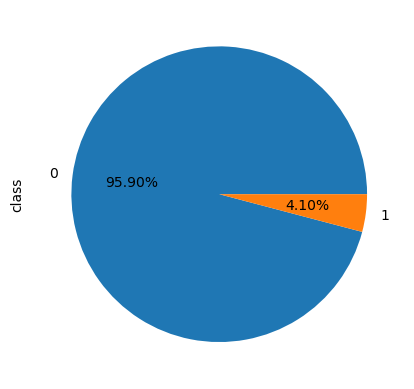

In [16]:
y_train.value_counts().plot(kind = 'pie', autopct = "%1.2f%%")
plt.show()

#### OBSERVATIONS:
- Default rate is 4.10% thereby indicating Class Imbalance (where one class is underrepresented)


ISSUES ARISING OUT OF IT: 
- Prediction bias :   Due to the class imbalance, a classifier trained on this data may have a bias towards predicting the majority class. This is because the classifier's objective is often to maximize overall accuracy, and it can achieve high accuracy by simply predicting the majority class for most instances. As a result, the minority class may be overlooked or misclassified.

- Performance evaluation:   Standard performance metrics like accuracy may not provide an accurate assessment of the classifier's performance. Accuracy alone is not a reliable indicator when the classes are imbalanced. Other evaluation metrics like precision, recall, F1-score, or area under the receiver operating characteristic curve (AUC-ROC) can provide a more comprehensive understanding of the model's performance.

REMEDIES: 

- Sampling techniques: Addressing class imbalance often involves applying various sampling techniques. Oversampling the minority class (e.g., duplicating instances) or undersampling the majority class (e.g., removing instances) can help balance the class distribution and improve the model's ability to learn from the minority class.

- Class weighting: Some algorithms or models allow for assigning different weights to different classes during training. By assigning a higher weight to the minority class, the model can give it more importance and focus during the learning process.

### Problem 4: Missing Values 

In [17]:
# Function
# MISSING DATA SUMMARY COLUMN WISE
def missing_data_summary_colwise(df):
    total = df.isnull().sum().sort_values(ascending=False)
    percent = df.isnull().mean() * 100
    percent = percent.sort_values(ascending=False)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    return missing_data

def missing_data_summary_rowwise(df):
    # Find the total missing values in each row
    total = df.isnull().sum(axis=1)
    percent = (total / (df.shape[1]-1)) * 100
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    missing_data = missing_data.sort_values(by='Total', ascending=False)
    return missing_data

def get_missing_rows_by_total(total_value):
    t = missing_data_summary_colwise[missing_data_summary_colwise['Total'] == total_value]
    missing_rows = df[t.index][df[t.index].isnull().any(axis=1)]
    return missing_rows


# SPARSITY MATRIX
import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt

import seaborn as sns
import matplotlib.pyplot as plt

def generate_sparsity_matrix(df):
    # Find columns with missing values
    missing_df = df.columns[df.isnull().any()].tolist()
    
    # Exclude columns with no missing values
    missing_df = [col for col in missing_df if df[col].isnull().sum() > 0]
    
    # Sort columns in descending order based on the number of missing values
    missing_counts = df[missing_df].isnull().sum().sort_values(ascending=False)
    sorted_cols = missing_counts.index
    
    # Generate the sparsity matrix
    sns.set(style="white")
    plt.figure(figsize=(15, 6))
    cmap = sns.color_palette("Blues", as_cmap=True)
    sns.heatmap(X_train[sorted_cols].isnull(), cmap=cmap, cbar=False)
    plt.title('Sparsity Matrix')
    plt.xlabel('Attributes')
    plt.ylabel('Samples')
    plt.xticks(rotation=90)
    plt.show()

In [18]:
#Filter rows with missing values
missing_rows = missing_data_summary_rowwise(X_train)
missing_rows[missing_rows['Total'] > 0]

,Total,Percent
5334,20,31.746032
279,19,30.158730
3908,15,23.809524
6293,15,23.809524
5986,15,23.809524
1232,15,23.809524
1814,15,23.809524
2499,15,23.809524
75,15,23.809524
6182,14,22.222222


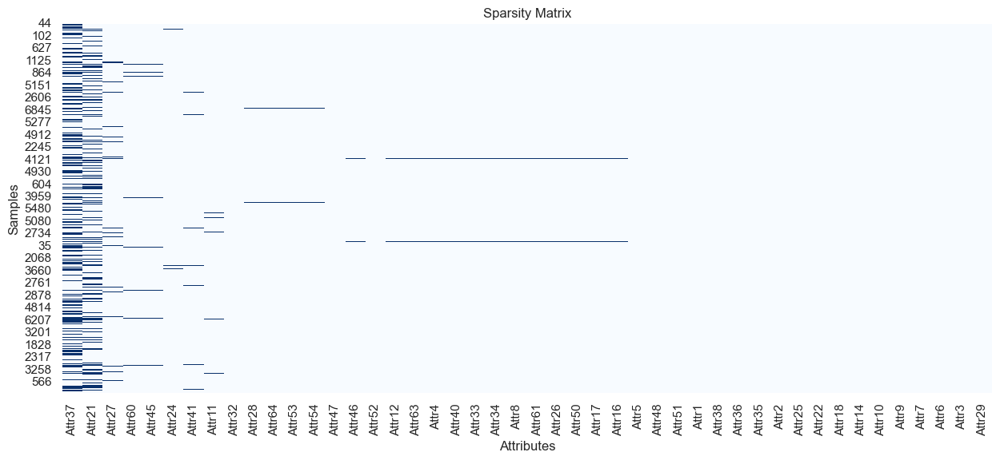

,Total,Percent
Attr37,2155,38.786897
Attr21,1308,23.542117
Attr27,239,4.301656
Attr60,106,1.907847
Attr45,105,1.889849
Attr24,101,1.817855
Attr41,63,1.133909
Attr11,34,0.611951
Attr32,31,0.557955
Attr53,23,0.413967


In [19]:
#Filtering missing values column wise
generate_sparsity_matrix(X_train)
missing_data_summary_colwise(X_train)[missing_data_summary_colwise(X_train)['Total']>0]

In [20]:
#shape
X_train.shape,X_test.shape, y_train.shape, y_test.shape

((5556, 64), (1389, 64), (5556,), (1389,))

### Observations: 
- Atr 60 & Attr 45 : X60 sales / inventory AND X45 net profit / inventory 
- Attr64, Attr54, Attr53, Attr28 : (all have 'fixed assets as their denominator)
- Attr47, Attr33, Attr52, Attr40, Attr63, Attr4, Attr12: (due to short-term liabilities)
- Attr26, Attr50, Attr17, Attr16, Attr8, Attr34 : (total liabilities as denominator)



#### METHOD1 : Dropping Columns ----> Dropping Rows with >5% missing values

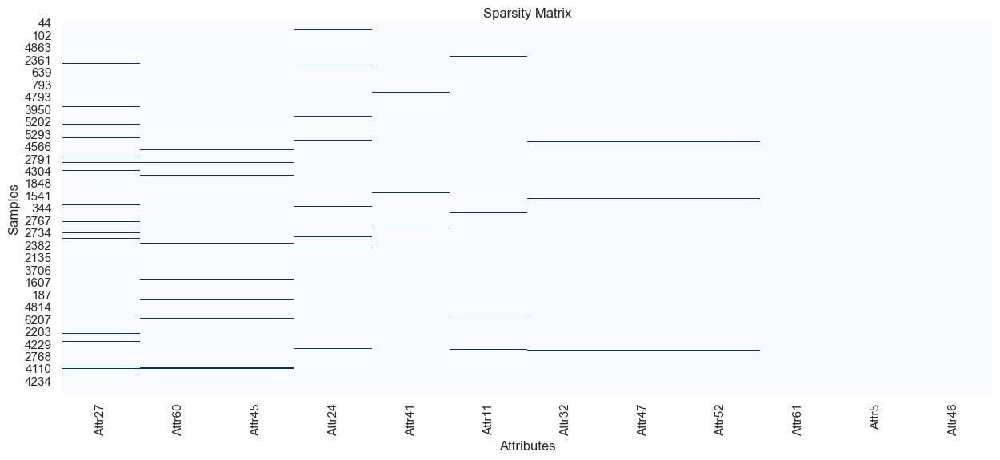

In [21]:
#Dropping Attr 37 and Attr 21 as they have 29.13% and 39% missing data 
X_train.drop(columns = ['Attr37','Attr21'], axis=1, inplace=True)
X_test.drop(columns = ['Attr37','Attr21'], axis=1, inplace=True)


missing_row=missing_data_summary_rowwise(X_train)
filtered_rows=missing_row[missing_row['Percent']>5]
filtered_rows

missing_row1=missing_data_summary_rowwise(X_test)
filtered_rows1=missing_row1[missing_row1['Percent']>5]
filtered_rows1

X_train.drop(filtered_rows.index,inplace=True)
X_test.drop(filtered_rows1.index,inplace=True)

# Remove the same rows from y_train and y_test
y_train.drop(filtered_rows.index, inplace=True)
y_test.drop(filtered_rows1.index, inplace=True)

generate_sparsity_matrix(X_train)

In [22]:
X_train.shape,X_test.shape, y_train.shape, y_test.shape

((5497, 62), (1367, 62), (5497,), (1367,))

#### Observations:
- 59 rows are lost (5556-5497) i.e. 1.06% data 

In [23]:
#column wise missing data
missing_data_summary_colwise(X_train)[missing_data_summary_colwise(X_train)['Total']>0]

,Total,Percent
Attr27,224,4.074950
Attr60,98,1.782791
Attr45,97,1.764599
Attr24,96,1.746407
Attr41,56,1.018737
Attr11,32,0.582136
Attr32,18,0.327451
Attr47,10,0.181917
Attr52,10,0.181917
Attr61,3,0.054575


- X27 profit on operating activities / financial expenses
- X60 sales / inventory
- X45 net profit / inventory
- X24 gross profit (in 3 years) / total assets
- X41 total liabilities / ((profit on operating activities + depreciation) * (12/365))
- X11 (gross profit + extraordinary items + financial expenses) / total assets
- X32 (current liabilities * 365) / cost of products sold
- X47 (inventory * 365) / cost of products sold
- X52 (short-term liabilities * 365) / cost of products sold)
- X61 sales / receivables
- X5 [(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation)] * 365
- X46 (current assets - inventory) / short-term liabilities

#### METHOD2 : Dropping Rows with >5% missing values----> Dropping Columns 

In [24]:
# #Dropping Missing Rows
# missing_row=calculate_missing_rows(df)
# filtered_rows=missing_row[missing_row['Percent Missing']>5]
# filtered_rows
# df.drop(filtered_rows.index,inplace=True)


# df.drop('Attr37', axis=1, inplace=True)
# df.drop('Attr21', axis=1, inplace=True)

In [25]:
# method2=generate_sparsity_matrix(df)

#### Observations
- 5452 out of 5556 rows are left i.e. 130 rows are left (1.87% lost)
- While in method 1, 59 rows were lost, SO WE ADOPT METHOD 1

# PATTERN: Presence of 0 in many attributes and following a pattern

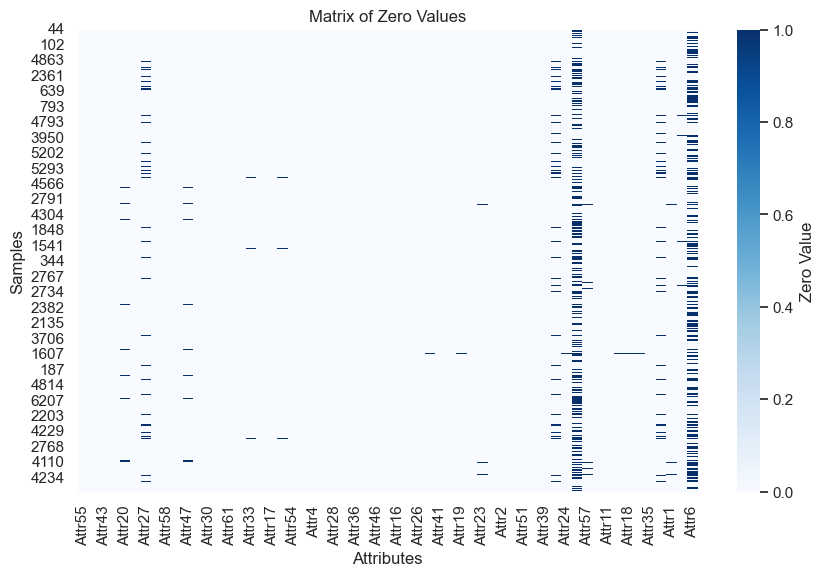

Attributes with zero values:

Attr55    4.511532e+07
Attr62    3.304471e+07
Attr43    3.203606e+07
Attr44    2.394075e+07
Attr20    8.095508e+06
Attr15    6.073966e+06
Attr27    5.542568e+06
Attr60    2.855541e+06
Attr58    1.114075e+06
Attr32    1.018825e+06
Attr47    4.969960e+05
Attr5     3.643646e+05
Attr30    1.646751e+05
Attr64    1.233992e+05
Attr61    6.205323e+04
Attr63    4.397764e+04
Attr33    3.875291e+04
Attr29    2.307904e+04
Attr17    2.078442e+04
Attr34    2.000032e+04
Attr54    1.912192e+04
Attr53    1.727247e+04
Attr4     1.472290e+04
Attr8     1.466681e+04
Attr28    1.464306e+04
Attr13    1.450501e+04
Attr36    1.174652e+04
Attr50    1.120414e+04
Attr46    1.051218e+04
Attr9     9.859697e+03
Attr16    4.838987e+03
Attr40    4.798740e+03
Attr26    4.618517e+03
Attr12    4.450501e+03
Attr41    3.461114e+03
Attr31    3.165734e+03
Attr19    3.113427e+03
Attr38    3.047441e+03
Attr23    2.867056e+03
Attr52    2.862396e+03
Attr2     2.804483e+03
Attr10    2.571587e+03
Attr

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

def zero_matrix(df, palette='RdYlBu'):
    zero_counts = df.sum().sort_values(ascending=False)
    zero_counts = zero_counts[zero_counts > 0]  # Exclude attributes with zero counts
    zero_matrix = (df[zero_counts.index] == 0)
    
    plt.figure(figsize=(10, 6))
    cmap = sns.color_palette(palette, as_cmap=True)
    sns.heatmap(zero_matrix, cmap=cmap, cbar=True, cbar_kws={'label': 'Zero Value'})
    plt.title('Matrix of Zero Values')
    plt.xlabel('Attributes')
    plt.ylabel('Samples')
    plt.show()
    
    print("Attributes with zero values:\n")
    print(zero_counts)

# Assuming you have a DataFrame named 'df'
zero_matrix(X_train, palette='Blues')


### Problem 5: Multicollinearity 

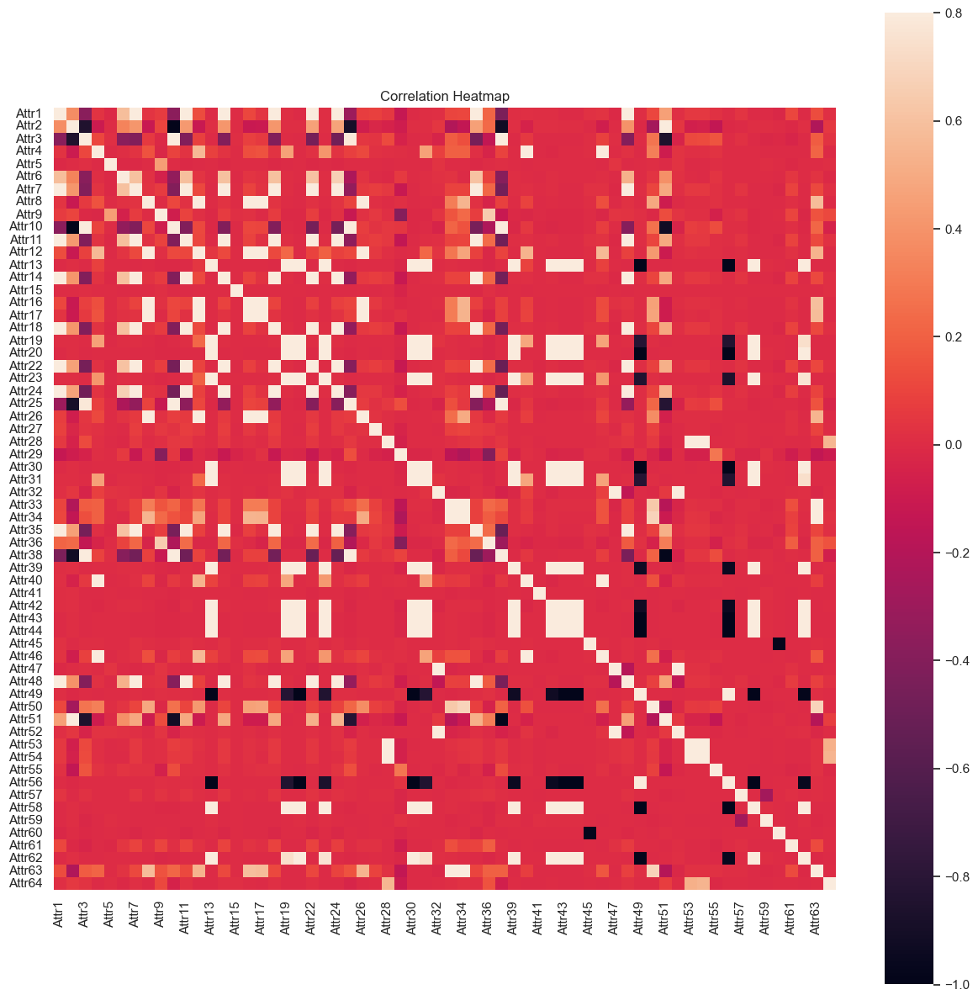

In [27]:
def generate_correlation_heatmap(df):
    # Calculate the correlation matrix
    corrmat = df.corr()

    # Create a heatmap using seaborn
    f, ax = plt.subplots(figsize=(15, 15))
    sns.heatmap(corrmat, vmax=.8, square=True)
    plt.title('Correlation Heatmap')

    # Display the plot
    plt.show()

# Assuming you have a DataFrame named 'df'
generate_correlation_heatmap(X_train)

# MEDIAN IMPUTATION

In [28]:
#median imputation
from sklearn.impute import SimpleImputer

# Create the imputer object with strategy='median'
imputer = SimpleImputer(strategy='median')

# Fit the imputer on X_train
imputer.fit(X_train)

# Transform X_train, X_test, and X_validation in-place
X_train = pd.DataFrame(imputer.transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(imputer.transform(X_test), columns=X_test.columns)
# X_val= pd.DataFrame(imputer.transform(X_val), columns=X_val.columns)


# OUTLIER DETECTION

In [29]:
# counting the values as outliers
import numpy as np

# Define the list of percentiles to calculate
percentiles = [0.05, 99.5]

# Loop through each column of X_train
for column in X_train.columns:
    # Calculate the percentiles for the current column
    percentiles_values = np.percentile(X_train[column], percentiles)
    quartile_05, quartile_995 = percentiles_values[0], percentiles_values[1]
    
    print(f"Column: {column}")
    print(f"The 0.05th quartile is: {quartile_05}")
    print(f"The 99.5th quartile is: {quartile_995}")

    # Count the number of values below the 5th percentile
    values_below_5th_percentile = len([x for x in X_train[column] if x < quartile_05])

    # Count the number of values above the 99.5th percentile
    values_above_995th_percentile = len([x for x in X_train[column] if x > quartile_995])

    print(f"Number of values below the 5th percentile: {values_below_5th_percentile}")
    print(f"Number of values above the 99.5th percentile: {values_above_995th_percentile}")
    print()


Column: Attr1
The 0.05th quartile is: -1.1615908
The 99.5th quartile is: 0.7782135999999966
Number of values below the 5th percentile: 3
Number of values above the 99.5th percentile: 28

Column: Attr2
The 0.05th quartile is: 0.009937256000000002
The 99.5th quartile is: 1.6079799999999969
Number of values below the 5th percentile: 3
Number of values above the 99.5th percentile: 28

Column: Attr3
The 0.05th quartile is: -2.9266044
The 99.5th quartile is: 0.8409895999999994
Number of values below the 5th percentile: 3
Number of values above the 99.5th percentile: 28

Column: Attr4
The 0.05th quartile is: 0.13516504
The 99.5th quartile is: 26.186639999999972
Number of values below the 5th percentile: 3
Number of values above the 99.5th percentile: 28

Column: Attr5
The 0.05th quartile is: -48125.672
The 99.5th quartile is: 5203.703999999987
Number of values below the 5th percentile: 3
Number of values above the 99.5th percentile: 28

Column: Attr6
The 0.05th quartile is: -3.623198399999999

In [30]:
#removal of outliers
import numpy as np

# Define the list of percentiles to calculate
percentiles = [0.01, 99.9]

# Loop through each column of X_train
for column in X_train.columns:
    # Calculate the percentiles for the current column
    percentiles_values = np.percentile(X_train[column], percentiles)
    quartile_01, quartile_999 = percentiles_values[0], percentiles_values[1]
   
    # Filter rows within the range defined by the percentiles
    X_train = X_train[(X_train[column] >= quartile_01) & (X_train[column] <= quartile_999)]
    X_test = X_test[(X_test[column] >= quartile_01) & (X_test[column] <= quartile_999)]


In [31]:
# Now, remove the same rows from y_train and y_test
indices_to_keep_train = X_train.index
indices_to_keep_test = X_test.index

X_train = X_train.loc[indices_to_keep_train]
X_test = X_test.loc[indices_to_keep_test]

y_train = y_train.iloc[indices_to_keep_train]
y_test = y_test.iloc[indices_to_keep_test]


In [32]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((5073, 62), (1269, 62), (5073,), (1269,))

# STANDARDIZATION

In [33]:
#Standardization

from sklearn.preprocessing import StandardScaler

# Assuming 'X_train' is your training data DataFrame

# Create an instance of the StandardScaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform it
X_train_scaled = scaler.fit_transform(X_train)

# Fit the scaler on the training data and transform the test data
X_test_scaled = scaler.transform(X_test)

# Convert the scaled data back to a DataFrame
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# SMOTE

In [34]:
#Smote
from imblearn.over_sampling import SMOTE

# Assuming you have the following datasets: X_train, y_train

# Create an instance of SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training data
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# Print the shape of the original and SMOTE-enhanced training data
print("Original Training Data Shape:", X_train_scaled.shape, y_train.shape)
print("SMOTE-enhanced Training Data Shape:", X_train_smote.shape, y_train_smote.shape)

Original Training Data Shape: (5073, 62) (5073,)
SMOTE-enhanced Training Data Shape: (9748, 62) (9748,)


# REGULARIZATION - LASSO

In [35]:
feature_names = X_train_smote.columns.tolist()

In [36]:
from sklearn.linear_model import Lasso
import numpy as np

# Assuming your training data is in the 'X_train' variable, and the corresponding target values are in 'y_train'
# Assuming you have already preprocessed your data and scaled it if needed

# Create a Lasso regression model
lasso_model = Lasso(alpha=0.001)  # You can adjust the 'alpha' parameter for regularization strength

# Fit the model to the training data
lasso_model.fit(X_train_smote, y_train_smote)

# Get the coefficients of the model
coefficients = lasso_model.coef_

# Identify the selected features (those with non-zero coefficients)
selected_features = np.where(coefficients != 0)[0]

# You can then access the corresponding feature names or indices from your original dataset
# Example:
# feature_names = ['feature1', 'feature2', ...]
selected_feature_names = [feature_names[i] for i in selected_features]

# Print or use the selected features as needed
print("Selected features:", selected_feature_names)


Selected features: ['Attr1', 'Attr2', 'Attr3', 'Attr4', 'Attr5', 'Attr6', 'Attr7', 'Attr9', 'Attr10', 'Attr11', 'Attr12', 'Attr13', 'Attr14', 'Attr15', 'Attr17', 'Attr18', 'Attr20', 'Attr22', 'Attr24', 'Attr25', 'Attr27', 'Attr29', 'Attr30', 'Attr31', 'Attr32', 'Attr33', 'Attr34', 'Attr35', 'Attr36', 'Attr38', 'Attr39', 'Attr40', 'Attr41', 'Attr44', 'Attr45', 'Attr46', 'Attr48', 'Attr49', 'Attr50', 'Attr51', 'Attr52', 'Attr55', 'Attr58', 'Attr59', 'Attr60', 'Attr61', 'Attr63']


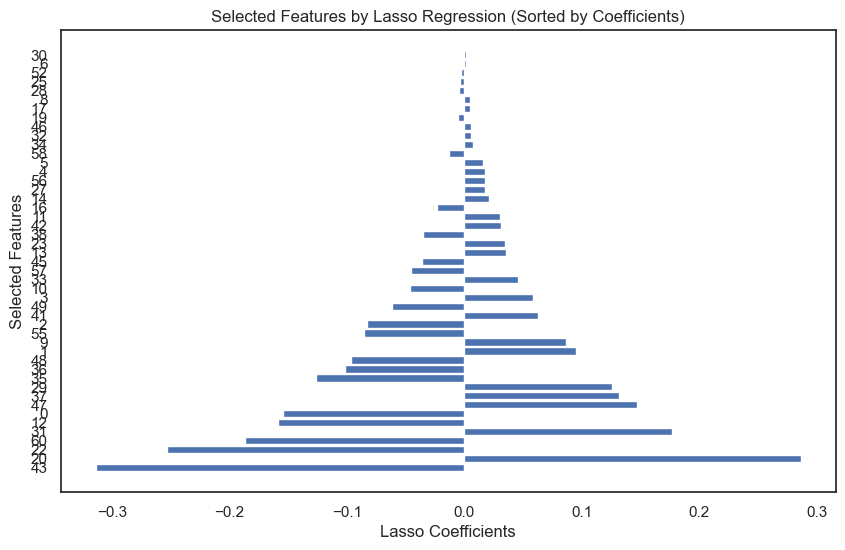

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Sort the selected features based on the absolute values of the coefficients in descending order
selected_features_sorted = sorted(selected_features, key=lambda x: -np.abs(coefficients[x]))

# Get the corresponding coefficients in the same order
sorted_coefficients = [coefficients[i] for i in selected_features_sorted]

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.barh(range(len(selected_features_sorted)), sorted_coefficients, tick_label=selected_features_sorted)
plt.xlabel('Lasso Coefficients')
plt.ylabel('Selected Features')
plt.title('Selected Features by Lasso Regression (Sorted by Coefficients)')
plt.show()


In [38]:
#keeping selected features
X_train_smote = X_train_smote.loc[:, selected_feature_names]
X_test_scaled = X_test_scaled.loc[:, selected_feature_names]


In [39]:
#shape
X_train_smote.shape, X_test_scaled.shape, y_train_smote.shape, y_test.shape

((9748, 47), (1269, 47), (9748,), (1269,))

# LOGISTIC REGRESSION

* x_train --> x_train_smote
* x_test --> x_test_scaled
* y_train --> y_train_smote
* y_test --> y_test

In [40]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Initialize the logistic regression model
logreg = LogisticRegression()

# Train the model on the training data
logreg.fit(X_train_smote, y_train_smote)

# Make predictions on the test data
y_pred = logreg.predict(X_test_scaled)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.7486209613869188


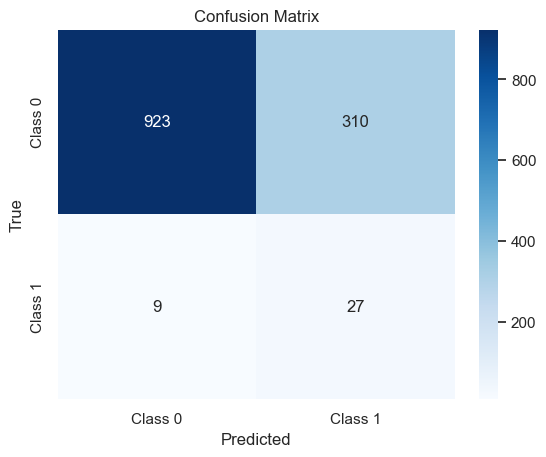

In [41]:
# Create the confusion matrix

from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)

# Define the class labels
class_labels = ['Class 0', 'Class 1']

# Create a heatmap of the confusion matrix
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)

# Set labels, title, and axis ticks
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.xticks(np.arange(len(class_labels)) + 0.5, class_labels)
plt.yticks(np.arange(len(class_labels)) + 0.5, class_labels)

# Display the plot
plt.show()

In [43]:
# Retrieve the coefficients and intercept of the logistic regression model
coefficients = logreg.coef_
intercept = logreg.intercept_

print("Coefficients:")
print(coefficients)
print("Intercept:")
print(intercept)

Coefficients:
[[-2.05637949e+00  1.94700693e+00 -7.50264514e-01  6.58913797e-02
   8.97532128e-02  1.74009375e-01  8.35455207e-01  4.19322760e-02
   1.82017782e+00 -1.59577757e+00  3.79989587e-01 -1.84963345e+00
   8.35455207e-01  8.91563386e-02 -1.86332882e-01  8.35455207e-01
   6.08285267e-02  2.65141179e+00 -2.22159557e+00  2.59862839e-01
  -4.53583516e-02  2.06580889e-01 -3.76098439e-02  1.09818621e+00
   6.41840160e+00  6.24771792e+00  6.98573745e-02  8.12683752e-01
   4.22207143e-02 -1.46818449e+00 -8.75916512e-01  1.33293602e+00
  -2.72613081e-01  5.28198600e-01  4.66452639e-01 -2.67691205e+00
  -1.03713269e+00  5.57918184e-01  1.73101017e+00 -1.68805752e+00
  -6.88224671e+00 -3.62916494e-03 -7.73254397e-01  1.37983638e-01
  -7.24064805e-01 -5.35081031e-02 -7.06424772e+00]]
Intercept:
[-1.49891987]


In [46]:
report = classification_report(y_test, y_pred)

# Print the classification report
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.75      0.85      1233
           1       0.08      0.75      0.14        36

    accuracy                           0.75      1269
   macro avg       0.54      0.75      0.50      1269
weighted avg       0.96      0.75      0.83      1269

